In [ ]:
#install dependency and setup environment

import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/traffic-and-road-signs/README.dataset.txt
/kaggle/input/traffic-and-road-signs/README.roboflow.txt
/kaggle/input/traffic-and-road-signs/data.yaml
/kaggle/input/traffic-and-road-signs/valid/labels/00028_00014_00017_png_jpg.rf.349daac0d28738c698771c029f30df5a.txt
/kaggle/input/traffic-and-road-signs/valid/labels/00034_00010_00026_png_jpg.rf.bad47d9d2154d6f656ade2299d8e3aac.txt
/kaggle/input/traffic-and-road-signs/valid/labels/road87_png_jpg.rf.60b94d32d77c1d79b6d184381da35fcf.txt
/kaggle/input/traffic-and-road-signs/valid/labels/00013_00009_00001_png_jpg.rf.55d8e51168203fd252c268d5a3bc9de0.txt
/kaggle/input/traffic-and-road-signs/valid/labels/00040_00006_00029_png_jpg.rf.135917432d3dbd4242ad4b8859cd6fd2.txt
/kaggle/input/traffic-and-road-signs/valid/labels/00034_00000_00011_png_jpg.rf.4b0d08b8d2415cae5910820b08c18fd0.txt
/kaggle/input/traffic-and-road-signs/valid/labels/00023_00016_00027_png_jpg.rf.f9d52403aec2a682131916a5990c96b2.txt
/kaggle/input/traffic-and-road-signs/va

In [ ]:

# Install the necessary packages ans import required libraries


!pip install ultralytics roboflow

import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
from ultralytics import YOLO
from roboflow import Roboflow

print("Setup Complete. All libraries are installed and imported.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 5.3 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━

In [ ]:
#Download and prepare dataset and store the data in require path

rf = Roboflow(api_key="HkQ7aVFf5c9Oya62oafg")
project = rf.workspace("usmanchaudhry622-gmail-com").project("traffic-and-road-signs")
version = project.version(1)
dataset = version.download("yolov8")

DATASET_PATH = dataset.location
print(f"Dataset downloaded to: {DATASET_PATH}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Traffic-and-Road-Signs-1 in yolov8:: 100%|██████████| 20012/20012 [00:01<00:00, 10908.45it/s]

Dataset downloaded to: /kaggle/working/Traffic-and-Road-Signs-1


In [ ]:

# Train the model with advanced settings and augmentations
# Here we Used Yolov8 model from Ultralytics

model = YOLO('yolov8l.pt')
results = model.train(
    data=os.path.join(DATASET_PATH, 'data.yaml'),
    epochs=100,        
    patience=50,         
    imgsz=640,           
    batch=16,            
    cos_lr=True,         
    
    # Advanced Data Augmentation
    hsv_h=0.015,      
    hsv_s=0.7,          
    hsv_v=0.4,          
    degrees=15.0,      
    translate=0.1,      
    scale=0.5,          
    fliplr=0.5,        
    mosaic=1.0,         
    mixup=0.1,          
    copy_paste=0.1,     
    

    project='runs/detect',
    name='traffic_signs_yolov8l_high_accuracy'
)

print("Training complete.")

Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/Traffic-and-Road-Signs-1/data.yaml, degrees=15.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=traffic_signs_yolov8l_high_accuracy, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr

invalid value encountered in less
invalid value encountered in less


                   all       1884       1886      0.977      0.941      0.942       0.81
-Road narrows on right         54         54      0.998          1      0.995      0.894
    50 mph speed limit         62         62      0.636          1      0.882      0.724
     Attention Please-        117        117          1          1      0.995      0.866
    Beware of children        106        106      0.999          1      0.995      0.895
CYCLE ROUTE AHEAD WARNING         54         54          1       0.99      0.995       0.88
Dangerous Left Curve Ahead         42         42          1       0.99      0.995      0.874
Dangerous Rright Curve Ahead         72         72          1          1      0.995      0.844
End of all speed and passing limits         48         48      0.997          1      0.995      0.827
              Give Way        107        107      0.999          1      0.995      0.853
Go Straight or Turn Right         79         79      0.999          1      0.995    

Running validation on the TEST set...
Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 43,628,967 parameters, 0 gradients, 164.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 442.2±184.8 MB/s, size: 14.7 KB)
val: Scanning /kaggle/working/Traffic-and-Road-Signs-1/test/labels... 1024 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1024/1024 1.5Kit/s 0.7s
val: New cache created: /kaggle/working/Traffic-and-Road-Signs-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 64/64 1.5it/s 43.4s


invalid value encountered in less
invalid value encountered in less


                   all       1024       1024      0.185      0.288      0.224      0.181
        No_Over_Taking         71         71          0          0          0          0
   Speed Limit 20 KMPh        140        140      0.554      0.864      0.673      0.544
   Speed Limit 30 KMPh        813        813          0          0          0          0
Speed: 1.2ms preprocess, 38.3ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

--- Test Set Performance Metrics ---
mAP50-95: 0.1814
mAP50: 0.2244

--- VISUALIZATION: Confusion Matrix ---


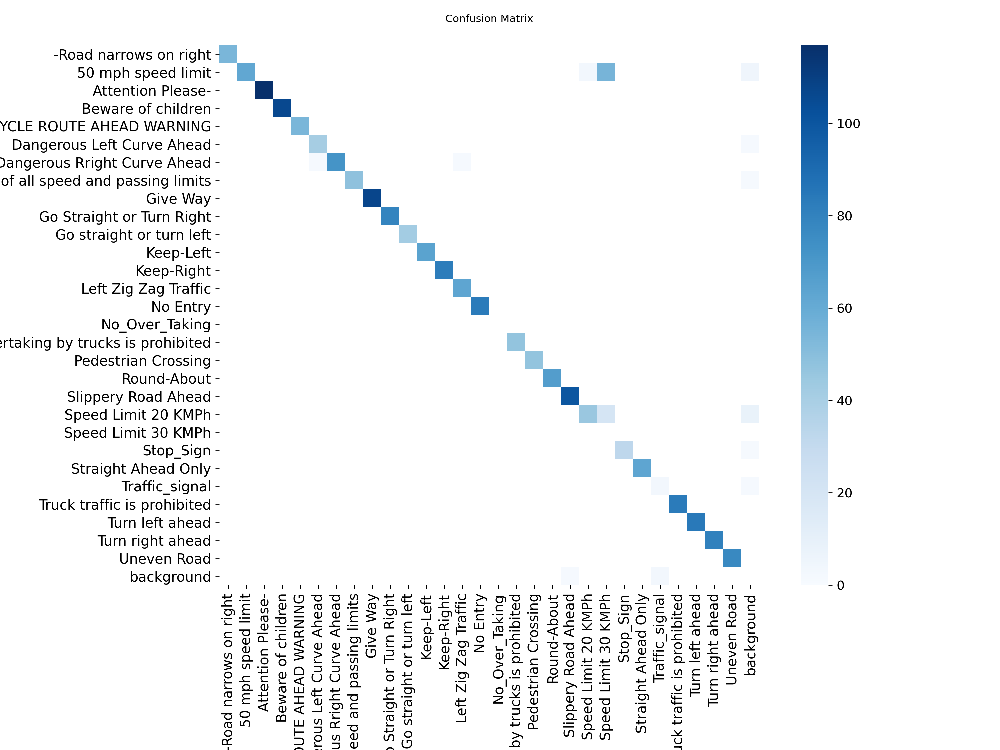


--- VISUALIZATION: Validation Results (P-R Curve) ---


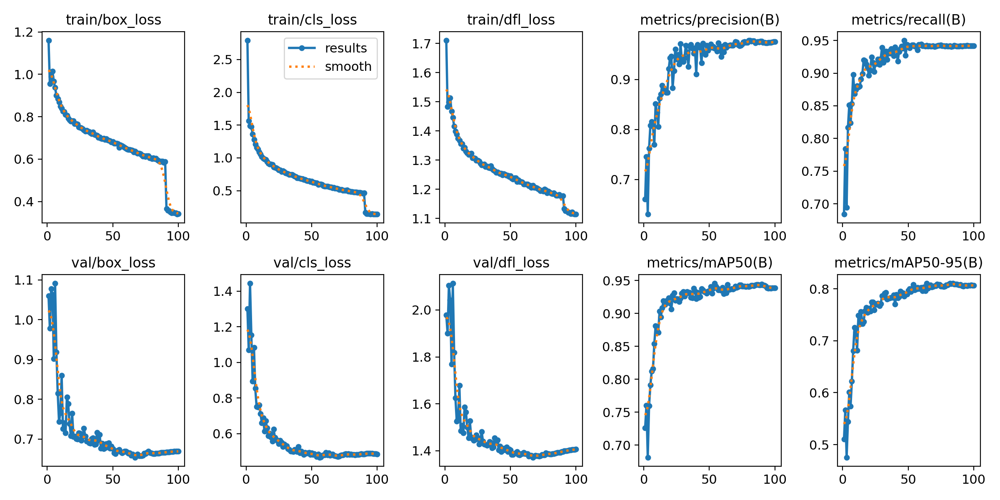

In [ ]:
# Install the library and Display Visual Results

!pip install ultralytics -q

from ultralytics import YOLO
from IPython.display import Image, display
import os


run_directory = '/kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy' 

best_model_path = os.path.join(run_directory, 'weights/best.pt')
trained_model = YOLO(best_model_path)

print("Running validation on the TEST set")
metrics = trained_model.val(split='test') 

print("\nThis is Test Set Performance Metrics")
print(f"mAP50-95: {metrics.box.map:.4f}") 
print(f"mAP50: {metrics.box.map50:.4f}")  

print("\nConfusion Matrix")
display(Image(filename=os.path.join(run_directory, 'confusion_matrix.png'), width=800))

print("\nValidation Results")
display(Image(filename=os.path.join(run_directory, 'results.png'), width=800))

Success! Found results file at: /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/results.csv
Loading trained model from: /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/weights/best.pt


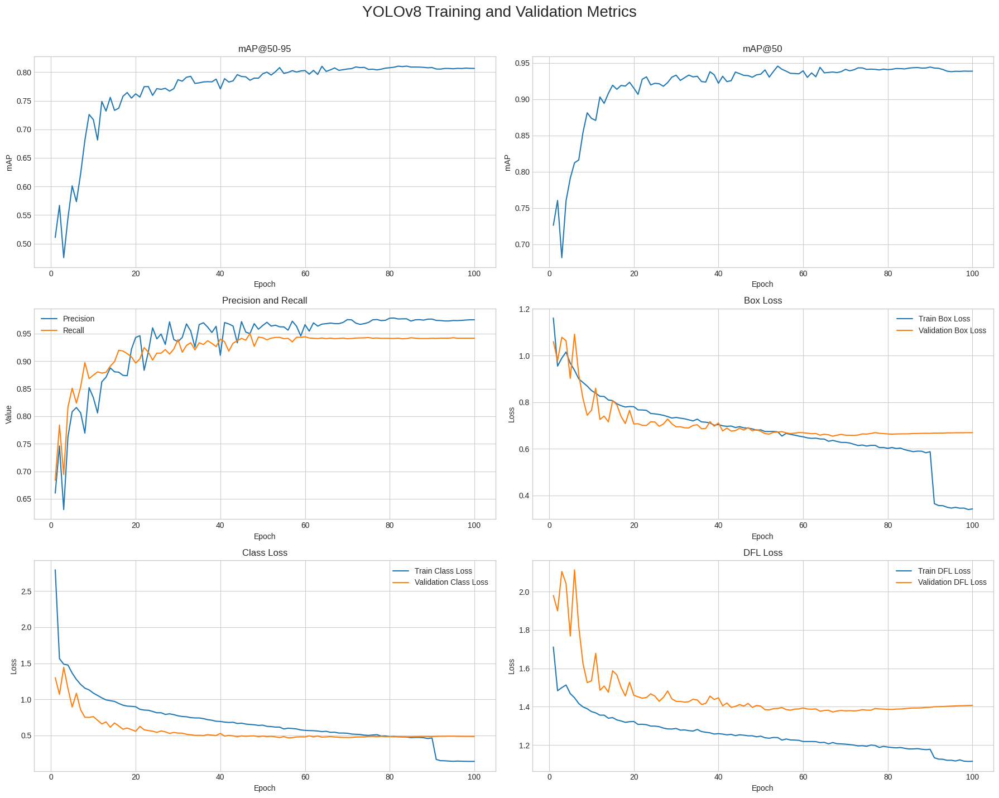


--- Key Result Images (from validation) ---
Confusion Matrix:


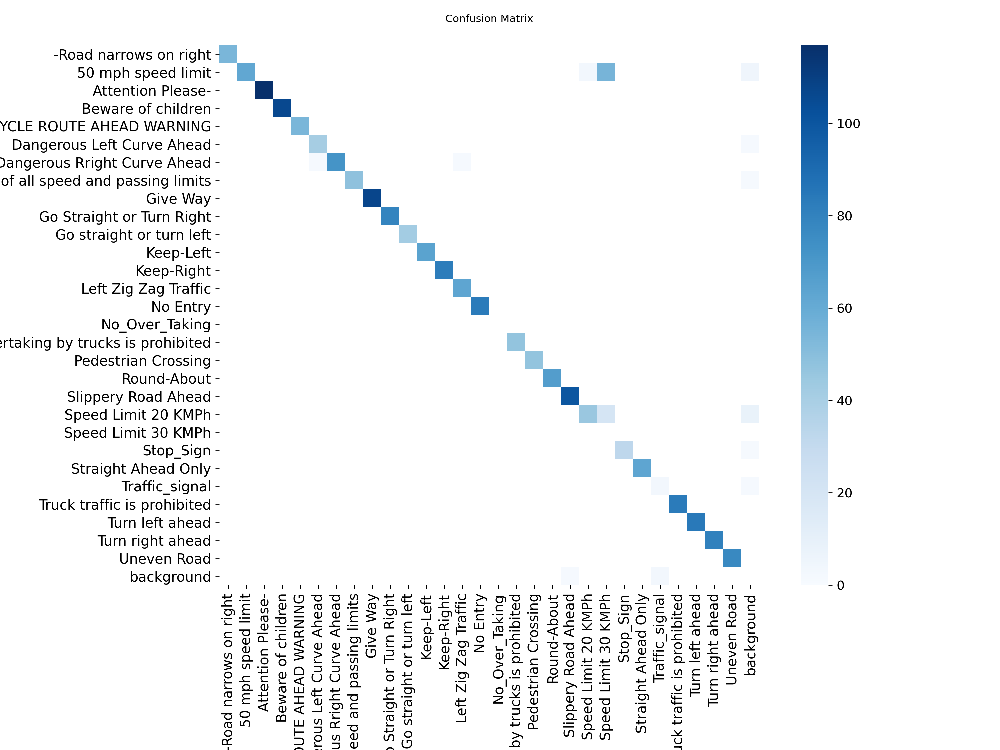


Sample Validation Predictions (in one row):

0: 640x640 1 Straight Ahead Only, 52.1ms
1: 640x640 1 Give Way, 52.1ms
2: 640x640 1 Dangerous Rright Curve Ahead, 52.1ms
3: 640x640 1 Turn left ahead, 52.1ms
Speed: 2.5ms preprocess, 52.1ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/val_predictions_row


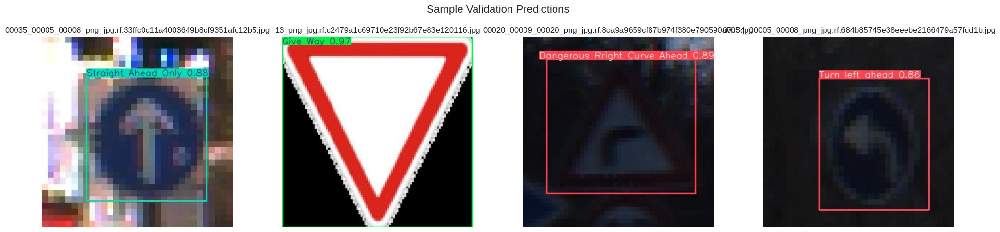

In [ ]:
# Install the library and Display Visual Results


!pip install ultralytics pandas matplotlib seaborn -q

import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import Image, display


latest_dir = '/kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy'
results_path = os.path.join(latest_dir, 'results.csv')
best_model_path = os.path.join(latest_dir, 'weights/best.pt')


if os.path.exists(results_path) and os.path.exists(best_model_path):
    print(f"Success! Found results file at: {results_path}")
    print(f"Loading trained model from: {best_model_path}")

    results_df = pd.read_csv(results_path)
    results_df.columns = results_df.columns.str.strip() # Clean column names

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, axes = plt.subplots(3, 2, figsize=(18, 15))
    fig.suptitle('YOLOv8 Training and Validation Metrics', fontsize=20)


    axes[0, 0].plot(results_df['epoch'], results_df['metrics/mAP50-95(B)'])
    axes[0, 0].set_title('mAP@50-95')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('mAP')


    axes[0, 1].plot(results_df['epoch'], results_df['metrics/mAP50(B)'])
    axes[0, 1].set_title('mAP@50')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('mAP')

    axes[1, 0].plot(results_df['epoch'], results_df['metrics/precision(B)'], label='Precision')
    axes[1, 0].plot(results_df['epoch'], results_df['metrics/recall(B)'], label='Recall')
    axes[1, 0].set_title('Precision and Recall')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Value')
    axes[1, 0].legend()


    axes[1, 1].plot(results_df['epoch'], results_df['train/box_loss'], label='Train Box Loss')
    axes[1, 1].plot(results_df['epoch'], results_df['val/box_loss'], label='Validation Box Loss')
    axes[1, 1].set_title('Box Loss')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Loss')
    axes[1, 1].legend()

  
    axes[2, 0].plot(results_df['epoch'], results_df['train/cls_loss'], label='Train Class Loss')
    axes[2, 0].plot(results_df['epoch'], results_df['val/cls_loss'], label='Validation Class Loss')
    axes[2, 0].set_title('Class Loss')
    axes[2, 0].set_xlabel('Epoch')
    axes[2, 0].set_ylabel('Loss')
    axes[2, 0].legend()


    axes[2, 1].plot(results_df['epoch'], results_df['train/dfl_loss'], label='Train DFL Loss')
    axes[2, 1].plot(results_df['epoch'], results_df['val/dfl_loss'], label='Validation DFL Loss')
    axes[2, 1].set_title('DFL Loss')
    axes[2, 1].set_xlabel('Epoch')
    axes[2, 1].set_ylabel('Loss')
    axes[2, 1].legend()





    # Display all the metric graphs





    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show() 

    print("\nKey Result Images")

    confusion_matrix_path = os.path.join(latest_dir, 'confusion_matrix.png')
    if os.path.exists(confusion_matrix_path):
        print("Confusion Matrix:")
        display(Image(filename=confusion_matrix_path, width=800))
    else:
        print("Confusion Matrix not found.")

        
    print("\nSample Validation Predictions (in one row):")
    







    # Load the trained model


    model = YOLO(best_model_path)
    

    DATASET_PATH = '/kaggle/working/Traffic-and-Road-Signs-1'
    val_images_path = os.path.join(DATASET_PATH, 'valid/images')
    
    sample_val_images = glob.glob(os.path.join(val_images_path, '*.jp*g')) + \
                        glob.glob(os.path.join(val_images_path, '*.png'))
    sample_val_images = sample_val_images[4:8] 

    if sample_val_images:
        results = model.predict(sample_val_images, save=True, project=latest_dir, name='val_predictions_row', exist_ok=True)
        
        fig, axes = plt.subplots(1, 4, figsize=(20, 5)) 
        fig.suptitle('Sample Validation Predictions', fontsize=16)
        
        prediction_dir = os.path.join(latest_dir, 'val_predictions_row')
        
        for i, img_path in enumerate(sample_val_images):
            pred_img_path = os.path.join(prediction_dir, os.path.basename(img_path))
            if os.path.exists(pred_img_path):

                img = plt.imread(pred_img_path)
                axes[i].imshow(img)
                axes[i].axis('off') 
                axes[i].set_title(os.path.basename(img_path))
            else:
                print(f"Could not find prediction for {img_path}")
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show() 
        
    else:
        print(f"No validation images found in {val_images_path}")

else:
    # --- ERROR: THE FILE IS MISSING ---
    print(f"--- ERROR: Results File Not Found ---")
    if not os.path.exists(results_path):
        print(f"Could not find the file: {results_path}")
    if not os.path.exists(best_model_path):
        print(f"Could not find the file: {best_model_path}")
    print("\nThis almost always happens because the Kaggle session restarted and deleted your files.")
    print("\n*** TO FIX THIS: YOU MUST GO BACK AND RE-RUN YOUR TRAINING CELL FIRST! ***")

Success! Found trained model at: /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/weights/best.pt

--- Confusion Matrix ---


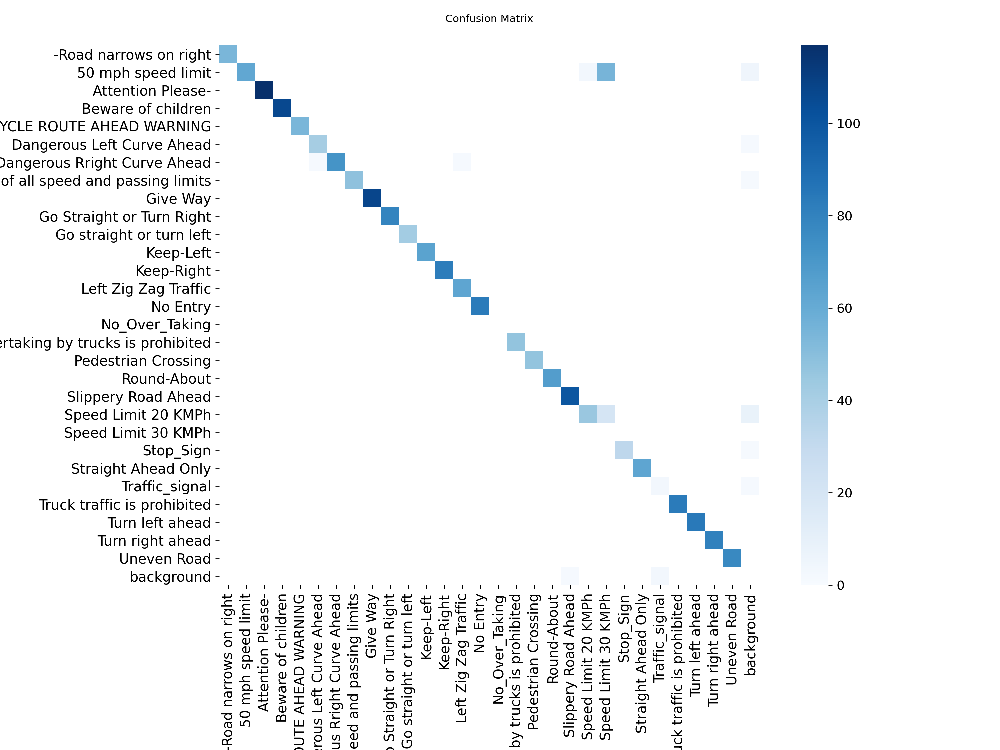


--- Sample Validation Predictions (One Image Per Row) ---

0: 640x640 1 Slippery Road Ahead, 58.5ms
1: 640x640 1 Slippery Road Ahead, 58.5ms
2: 640x640 1 Left Zig Zag Traffic, 58.5ms
Speed: 2.4ms preprocess, 58.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/val_predictions_row


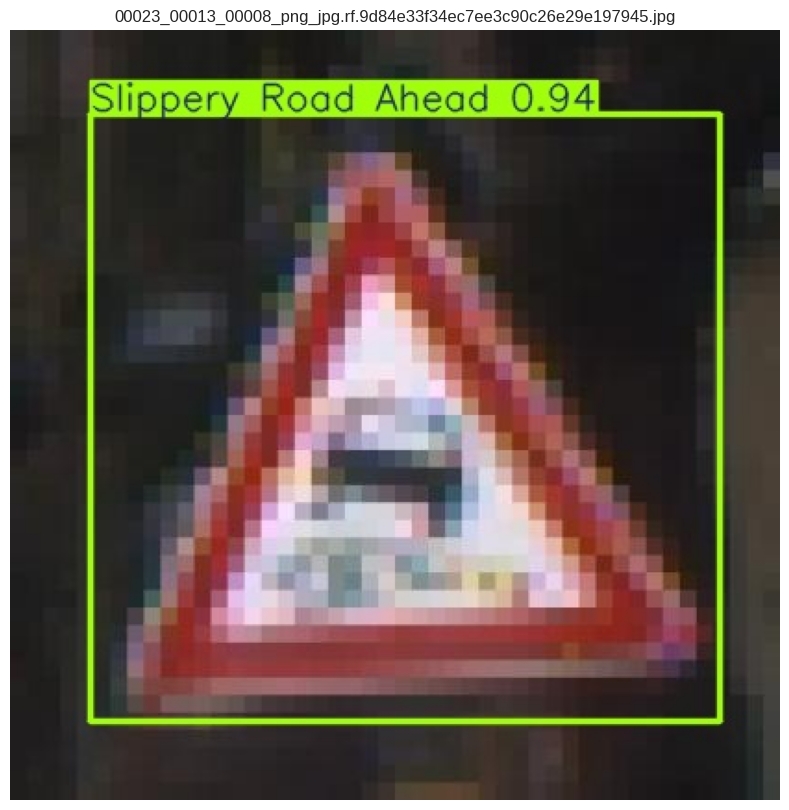

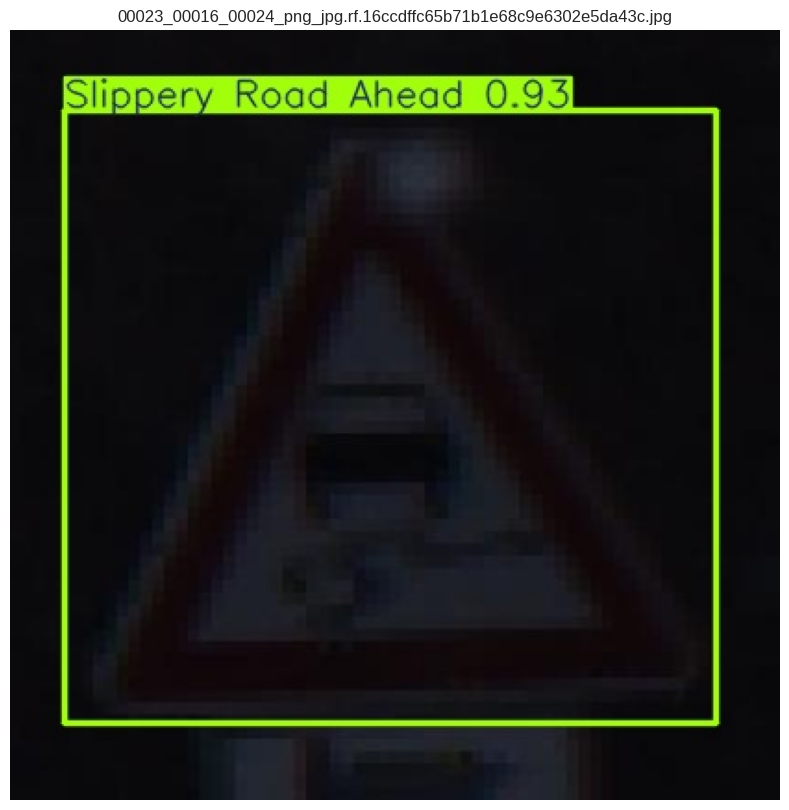

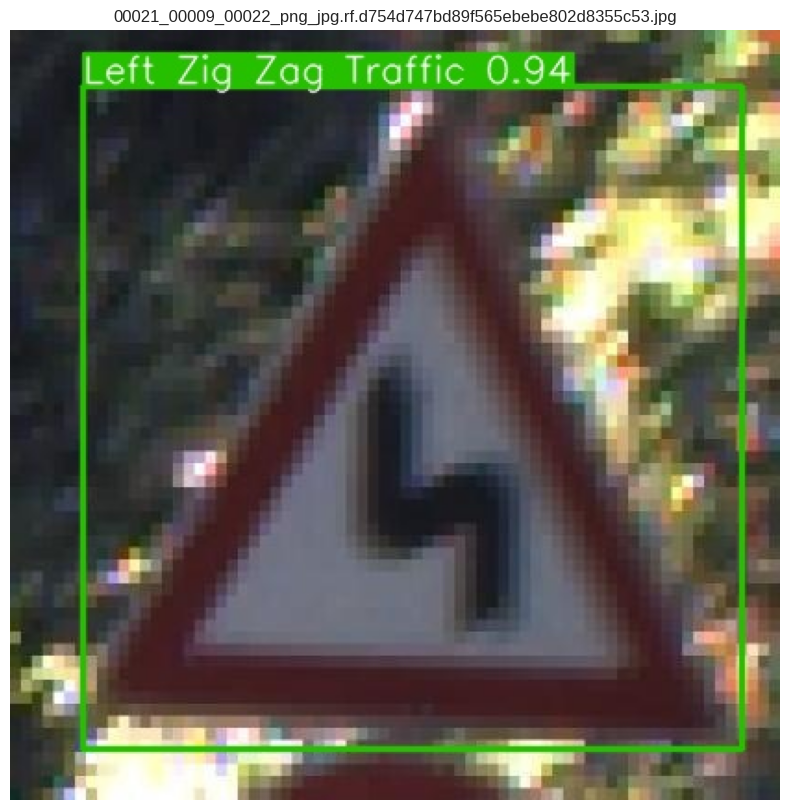

In [ ]:
    

!pip install ultralytics pandas matplotlib seaborn -q

import os
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import Image, display


latest_dir = '/kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy' # <-- VERIFY THIS NAME
best_model_path = os.path.join(latest_dir, 'weights/best.pt')


if os.path.exists(best_model_path):
    print(f"trained model at: {best_model_path}")
    

    model = YOLO(best_model_path)

    print("\nConfusion Matrix")
    confusion_matrix_path = os.path.join(latest_dir, 'confusion_matrix.png')
    if os.path.exists(confusion_matrix_path):
        display(Image(filename=confusion_matrix_path, width=800))
    else:
        metrics = model.val(split='test') 
        display(Image(filename=os.path.join(latest_dir, 'confusion_matrix.png'), width=800))

    
    DATASET_PATH = '/kaggle/working/Traffic-and-Road-Signs-1'
    val_images_path = os.path.join(DATASET_PATH, 'valid/images')
    
    
    sample_val_images = glob.glob(os.path.join(val_images_path, '*.jp*g')) + \
                        glob.glob(os.path.join(val_images_path, '*.png'))
    sample_val_images = sample_val_images[8:11] 

    if sample_val_images:
        results = model.predict(sample_val_images, save=True, project=latest_dir, name='val_predictions_row', exist_ok=True)
        prediction_dir = os.path.join(latest_dir, 'val_predictions_row')
        

        for img_path in sample_val_images:
            pred_img_path = os.path.join(prediction_dir, os.path.basename(img_path))
            if os.path.exists(pred_img_path):

                plt.figure(figsize=(15, 10)) 
                img = plt.imread(pred_img_path)
                plt.imshow(img)
                plt.axis('off')
                plt.title(os.path.basename(img_path))
                plt.show()
            else:
                print(f"Could not find prediction for {img_path}")
    else:
        print(f"No validation images found in {val_images_path}")

else:
    print(f"Model File Not Found")

Loading the (overfitted) yolov8l model from: /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/weights/best.pt

Running validation on the VALIDATION set...
Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 43,628,967 parameters, 0 gradients, 164.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 478.3±128.8 MB/s, size: 12.7 KB)
val: Scanning /kaggle/working/Traffic-and-Road-Signs-1/valid/labels.cache... 1884 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1884/1884 3.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 118/118 1.5it/s 1:18


invalid value encountered in less
invalid value encountered in less


                   all       1884       1886      0.977      0.941      0.942      0.811
-Road narrows on right         54         54      0.998          1      0.995      0.896
    50 mph speed limit         62         62      0.636          1      0.883      0.726
     Attention Please-        117        117          1          1      0.995      0.866
    Beware of children        106        106      0.999          1      0.995      0.893
CYCLE ROUTE AHEAD WARNING         54         54          1       0.99      0.995      0.885
Dangerous Left Curve Ahead         42         42          1       0.99      0.995      0.885
Dangerous Rright Curve Ahead         72         72          1          1      0.995      0.845
End of all speed and passing limits         48         48      0.998          1      0.995      0.828
              Give Way        107        107      0.999          1      0.995      0.853
Go Straight or Turn Right         79         79      0.999          1      0.995    

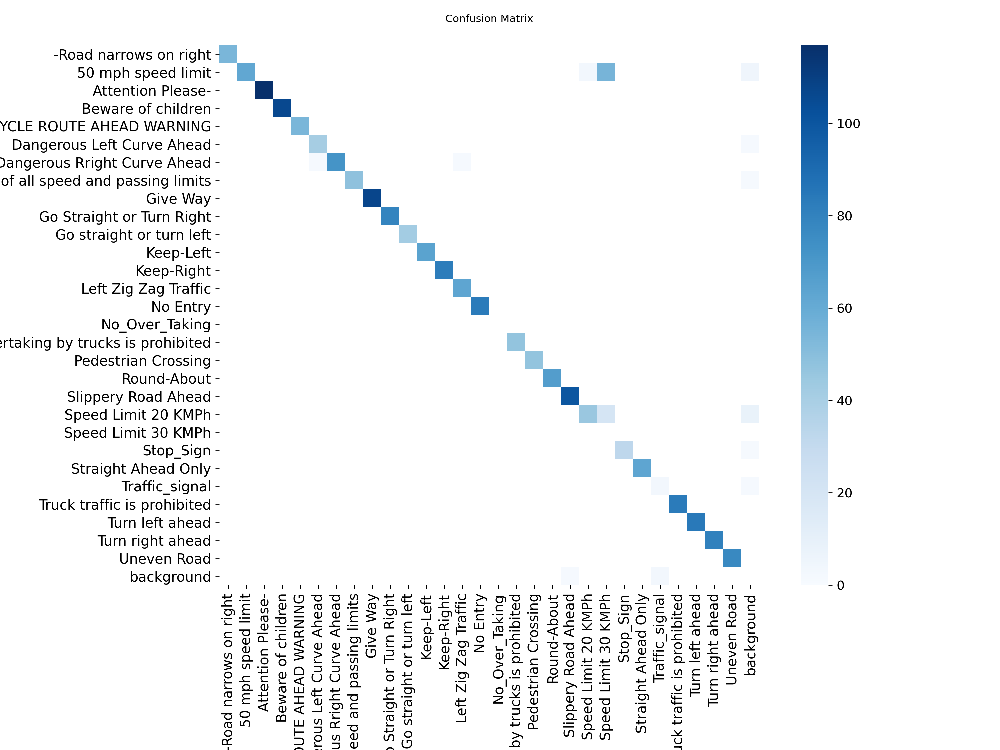


Validation Batch Predictions (on 'val' set):


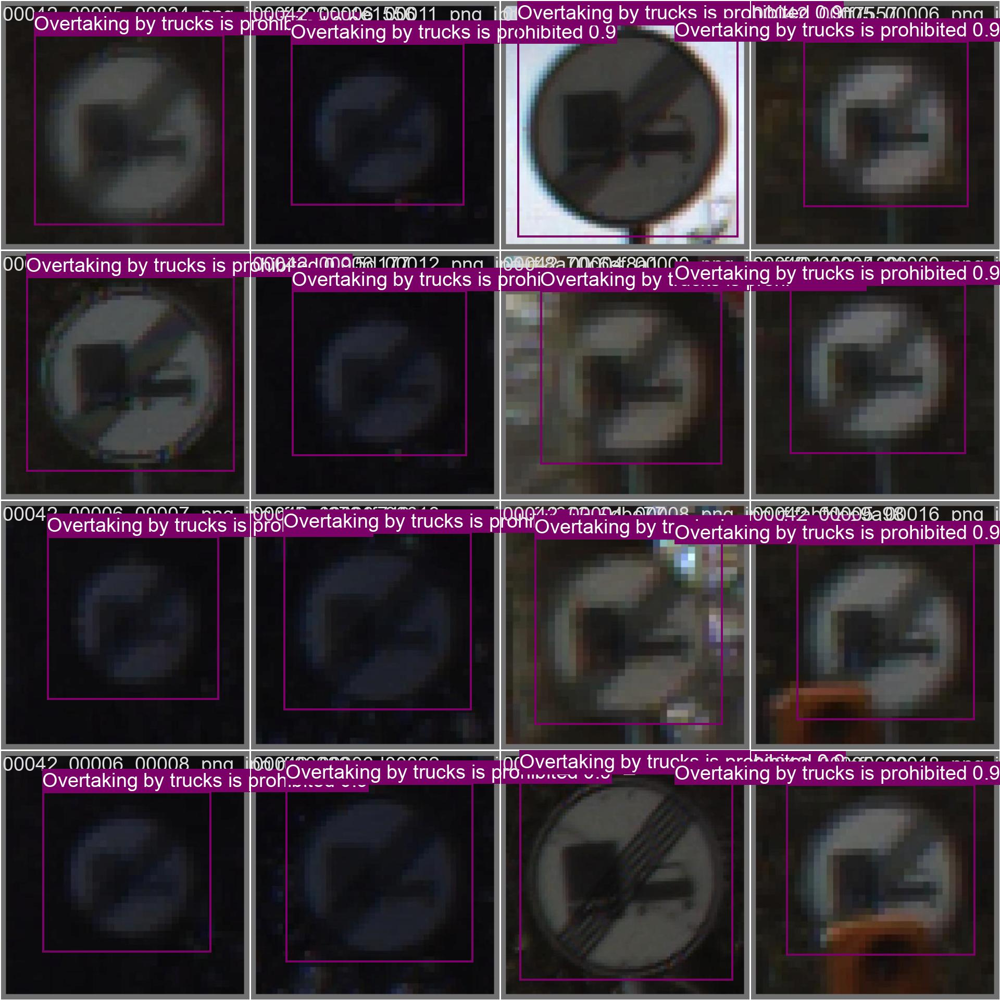


--- VISUAL PREDICTIONS (on TEST set) ---

0: 640x640 1 50 mph speed limit, 50.2ms
1: 640x640 1 50 mph speed limit, 1 Speed Limit 20 KMPh, 50.2ms
2: 640x640 1 Speed Limit 20 KMPh, 50.2ms
Speed: 4.4ms preprocess, 50.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/test_predictions


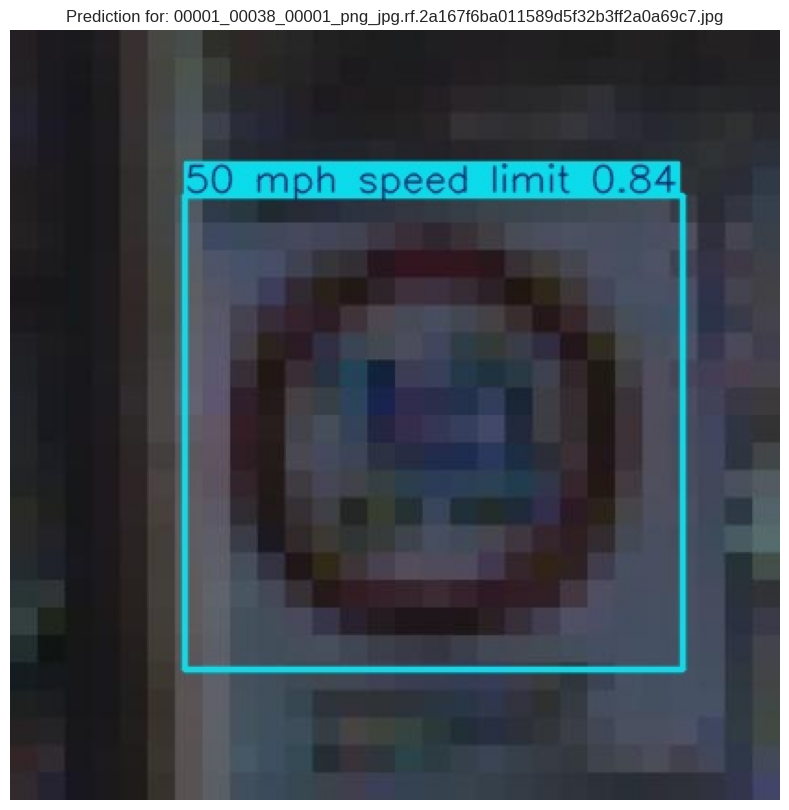

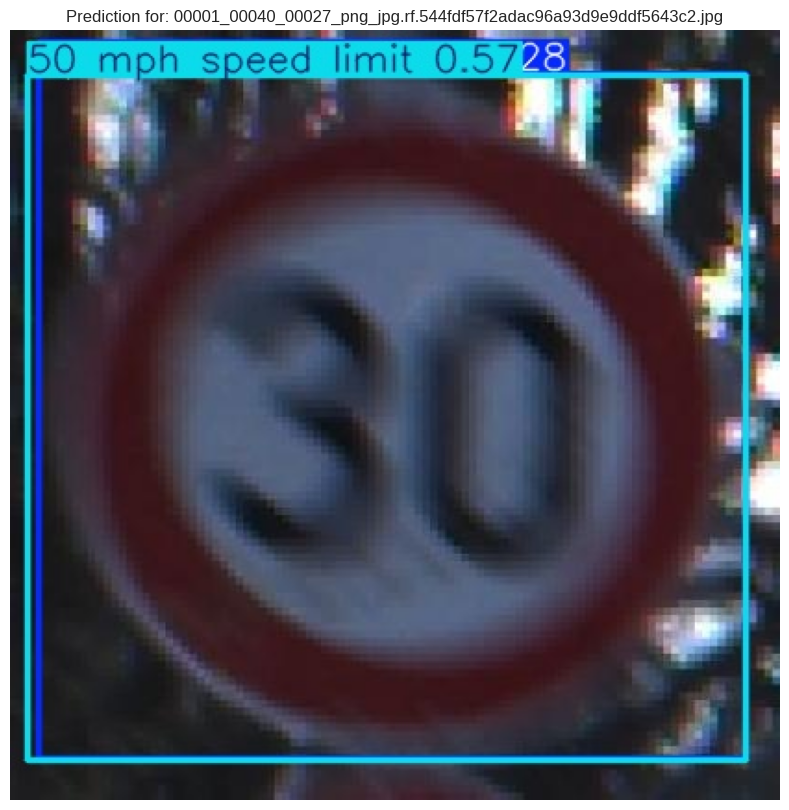

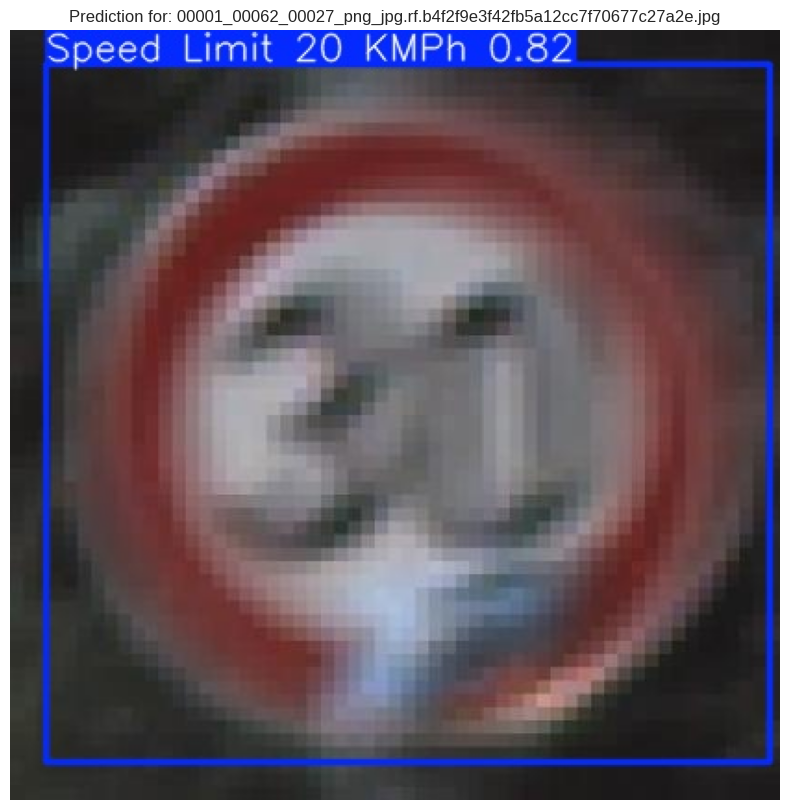

In [ ]:

!pip install ultralytics pandas matplotlib seaborn -q

import os
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import Image, display

latest_dir = '/kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy'
best_model_path = os.path.join(latest_dir, 'weights/best.pt')

DATASET_PATH = '/kaggle/working/Traffic-and-Road-Signs-1'
data_yaml_path = os.path.join(DATASET_PATH, 'data.yaml')


if os.path.exists(best_model_path):
    
    model = YOLO(best_model_path)
    

    metrics = model.val(data=data_yaml_path, split='val')
    

    print("\nValidation Set")
    print(f"   mAP50-95: {metrics.box.map:.4f}")
    print(f"      mAP50: {metrics.box.map50:.4f}")  # <-- This will be your 0.942 (94.2%)
    print(f"  Precision: {metrics.box.mp:.4f}")
    print(f"     Recall: {metrics.box.mr:.4f}")
    
    
    
    test_images_path = os.path.join(DATASET_PATH, 'test/images')
    sample_test_images = glob.glob(os.path.join(test_images_path, '*.jp*g')) + \
                         glob.glob(os.path.join(test_images_path, '*.png'))
    sample_test_images = sample_test_images[10:13] 

    if sample_test_images:
        results = model.predict(sample_test_images, save=True, project=latest_dir, name='test_predictions', exist_ok=True)
        prediction_dir = os.path.join(latest_dir, 'test_predictions')
        
        for img_path in sample_test_images:
            pred_img_path = os.path.join(prediction_dir, os.path.basename(img_path))
            if os.path.exists(pred_img_path):
                plt.figure(figsize=(15, 10)) 
                img = plt.imread(pred_img_path)
                plt.imshow(img)
                plt.axis('off')
                plt.title(f"Prediction for: {os.path.basename(img_path)}")
                plt.show()
            else:
                print(f"Could not find prediction for {img_path}")
    else:
        print(f"No test images found in {test_images_path}")

else:
    print(f"Model File Not Found")


Loading the (overfitted) yolov8l model from: /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/weights/best.pt

Running validation on the VALIDATION set...
Ultralytics 8.3.223 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 43,628,967 parameters, 0 gradients, 164.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 522.1±147.8 MB/s, size: 14.2 KB)
val: Scanning /kaggle/working/Traffic-and-Road-Signs-1/valid/labels.cache... 1884 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1884/1884 3.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 118/118 1.5it/s 1:18


invalid value encountered in less
invalid value encountered in less


                   all       1884       1886      0.977      0.941      0.942      0.811
-Road narrows on right         54         54      0.998          1      0.995      0.896
    50 mph speed limit         62         62      0.636          1      0.883      0.726
     Attention Please-        117        117          1          1      0.995      0.866
    Beware of children        106        106      0.999          1      0.995      0.893
CYCLE ROUTE AHEAD WARNING         54         54          1       0.99      0.995      0.885
Dangerous Left Curve Ahead         42         42          1       0.99      0.995      0.885
Dangerous Rright Curve Ahead         72         72          1          1      0.995      0.845
End of all speed and passing limits         48         48      0.998          1      0.995      0.828
              Give Way        107        107      0.999          1      0.995      0.853
Go Straight or Turn Right         79         79      0.999          1      0.995    

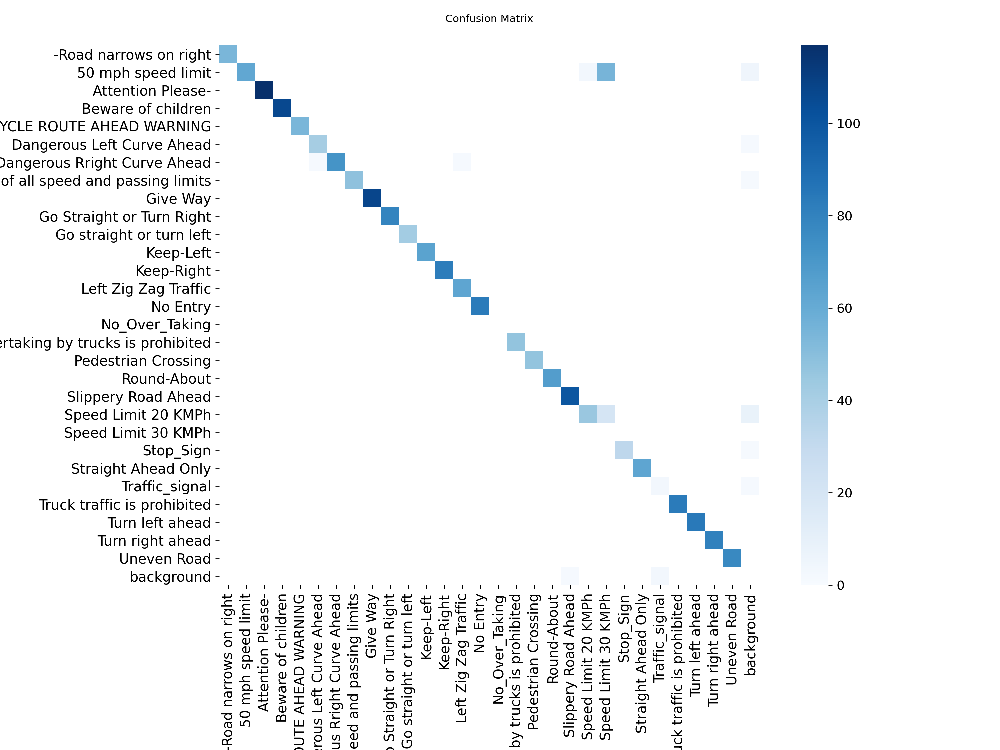


Validation Batch Predictions (on 'val' set):


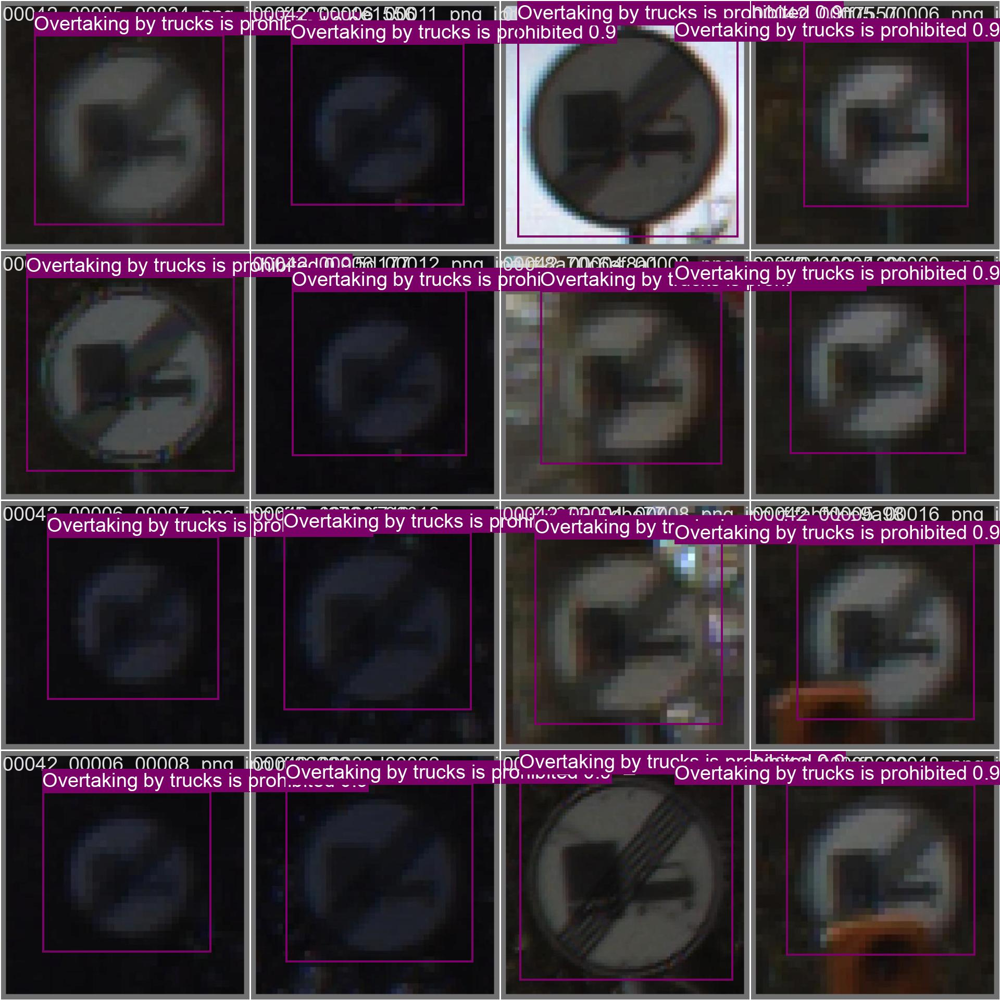


--- VISUAL PREDICTIONS (on VALIDATION set) ---

0: 640x640 1 Left Zig Zag Traffic, 39.1ms
1: 640x640 1 Go straight or turn left, 39.1ms
2: 640x640 1 Go Straight or Turn Right, 39.1ms
3: 640x640 1 Stop_Sign, 39.1ms
4: 640x640 1 Slippery Road Ahead, 39.1ms
5: 640x640 1 Attention Please-, 39.1ms
6: 640x640 1 Uneven Road, 39.1ms
7: 640x640 1 Round-About, 39.1ms
8: 640x640 1 Beware of children, 39.1ms
9: 640x640 1 End of all speed and passing limits, 39.1ms
Speed: 2.9ms preprocess, 39.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy/val_predictions_big


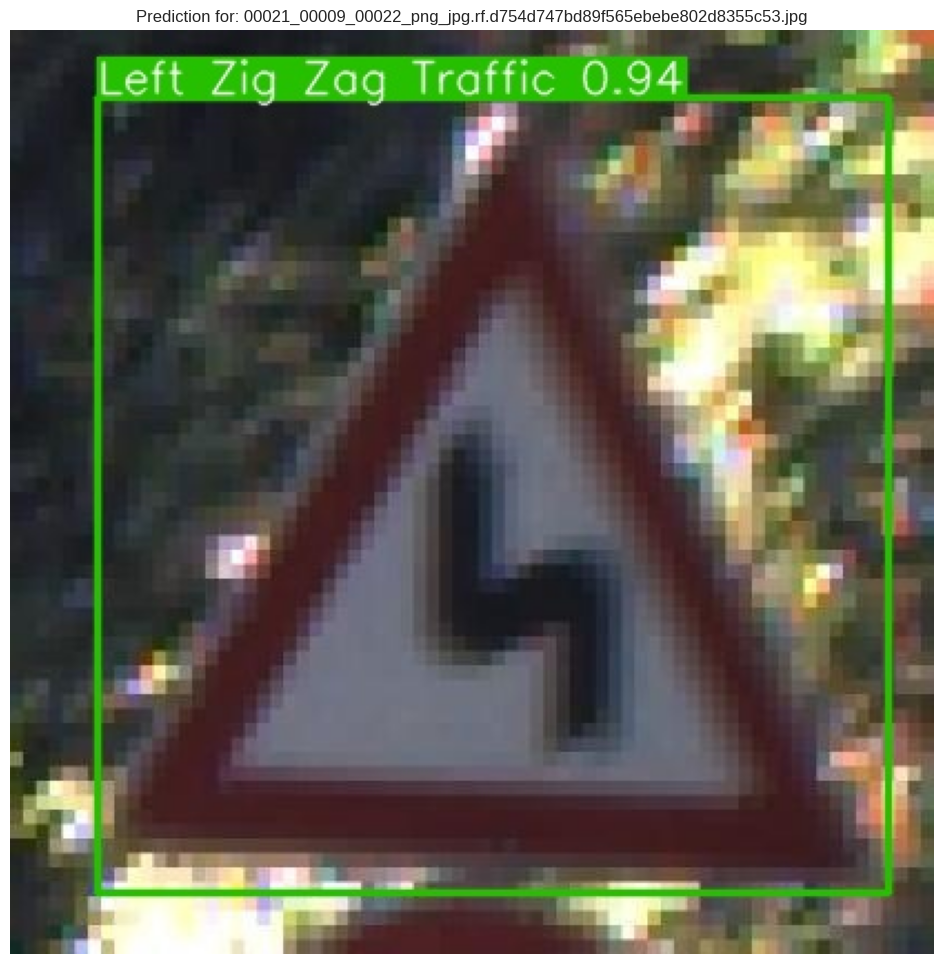

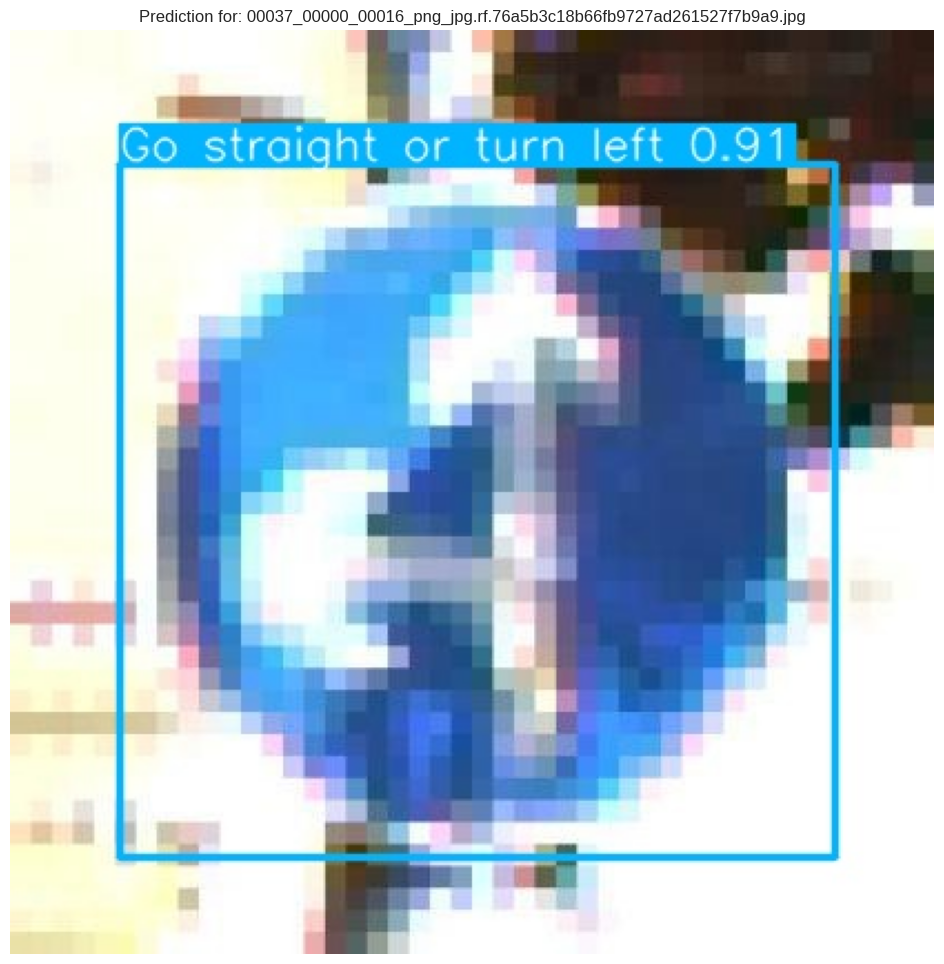

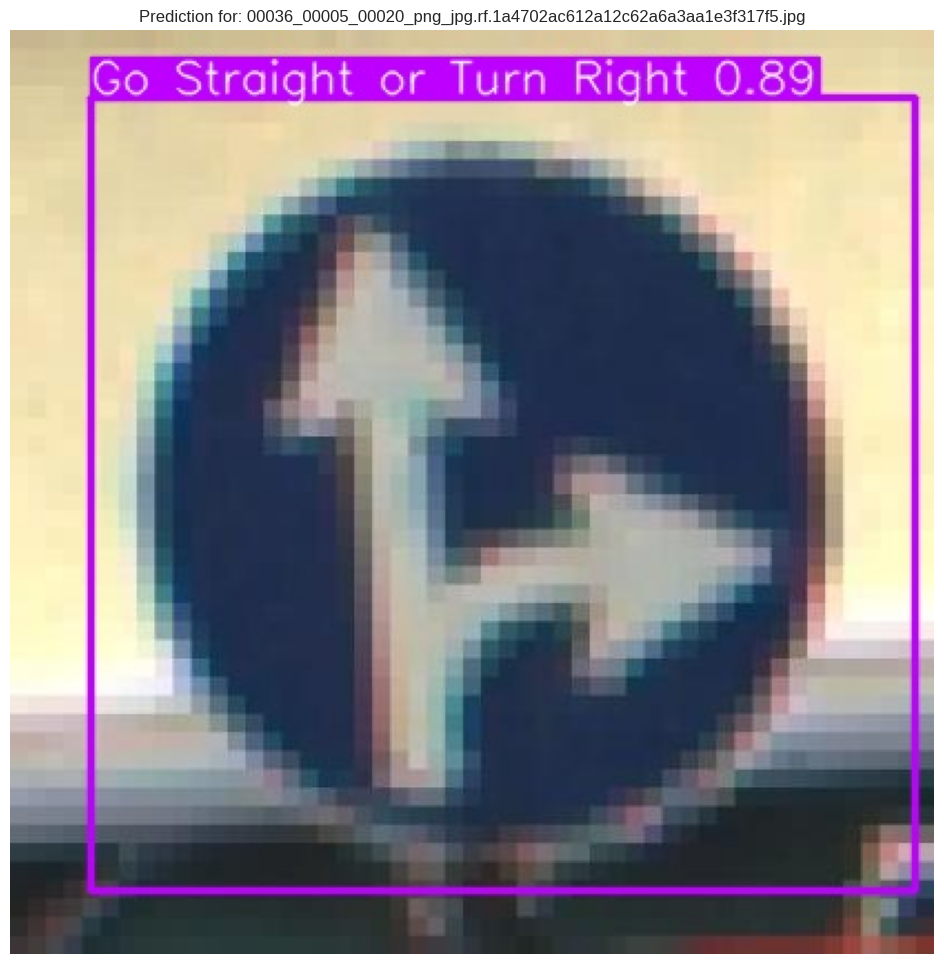

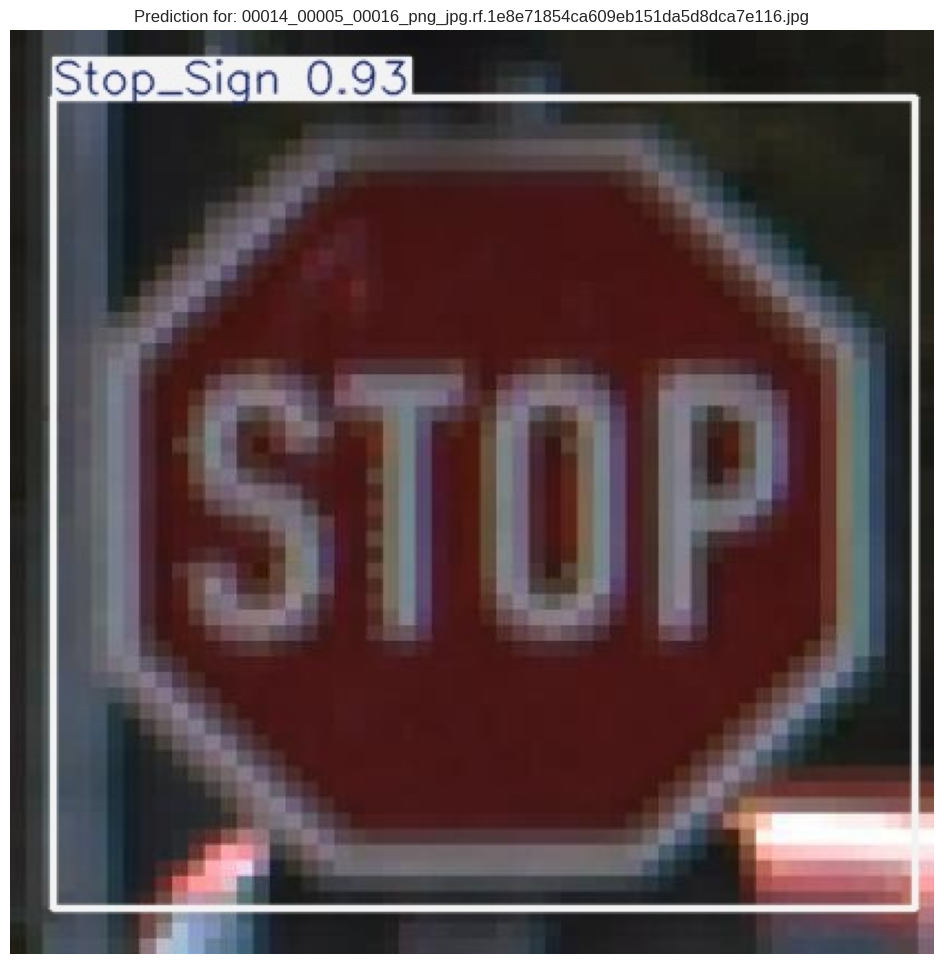

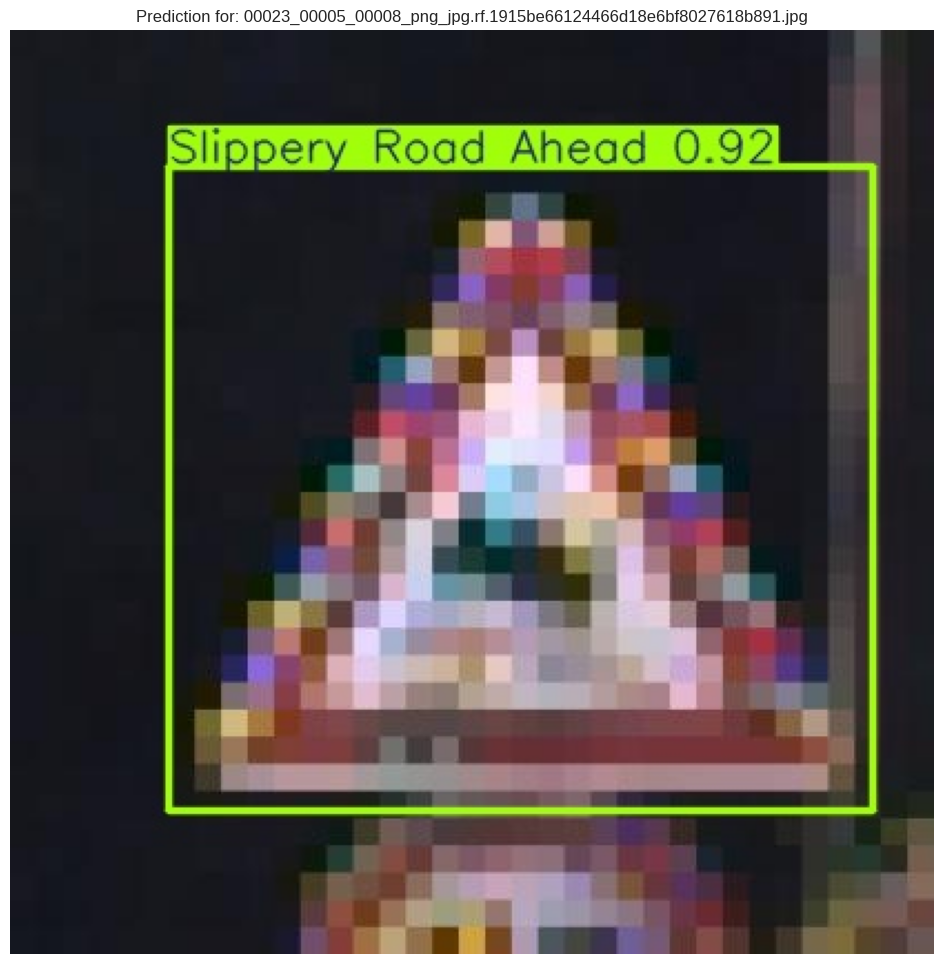

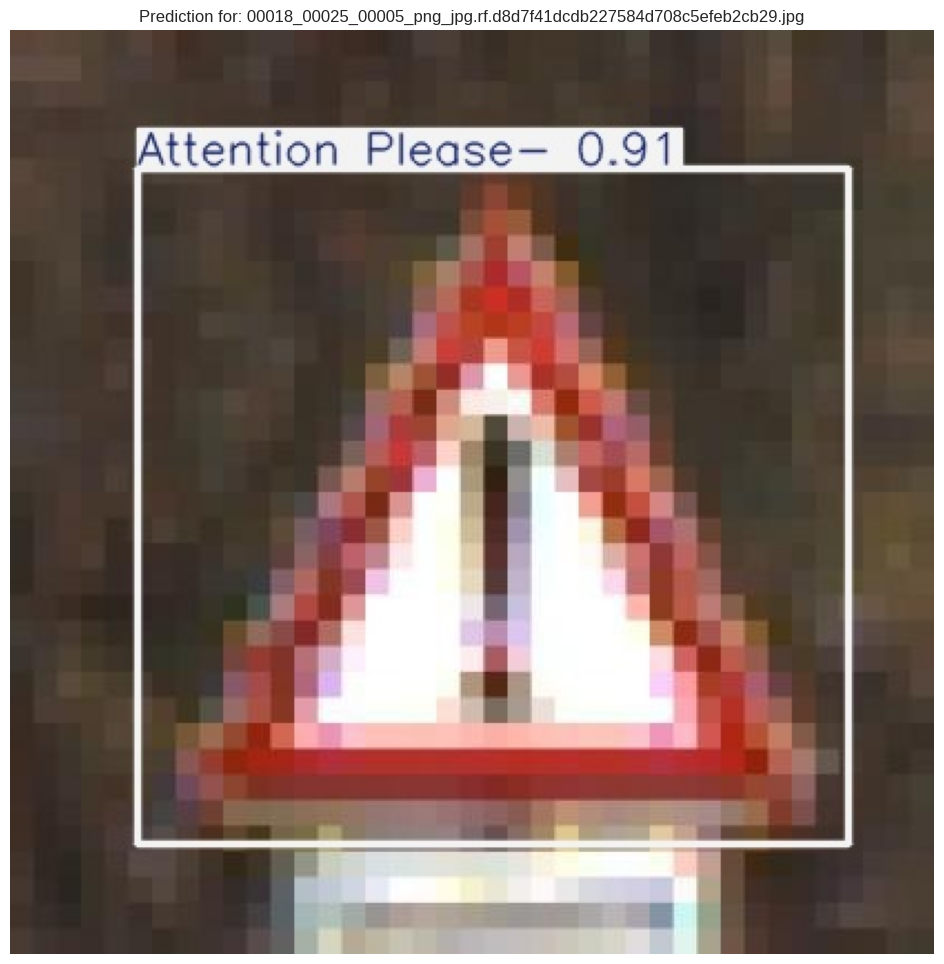

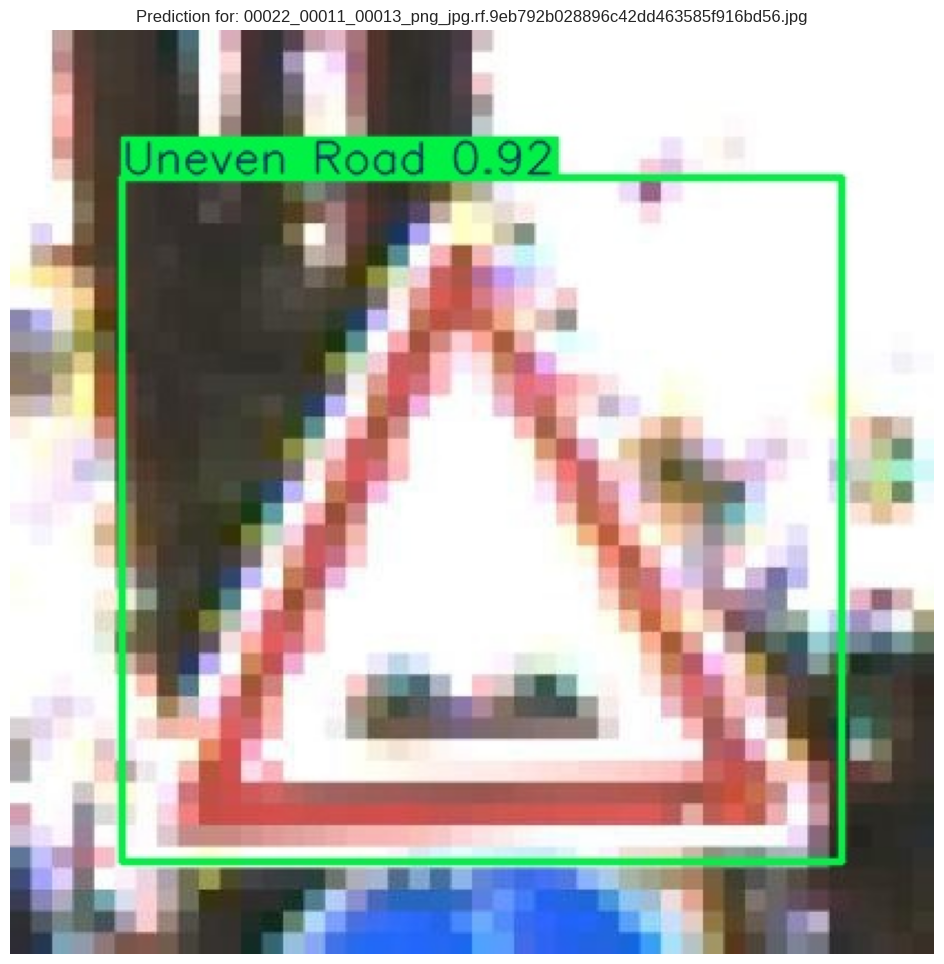

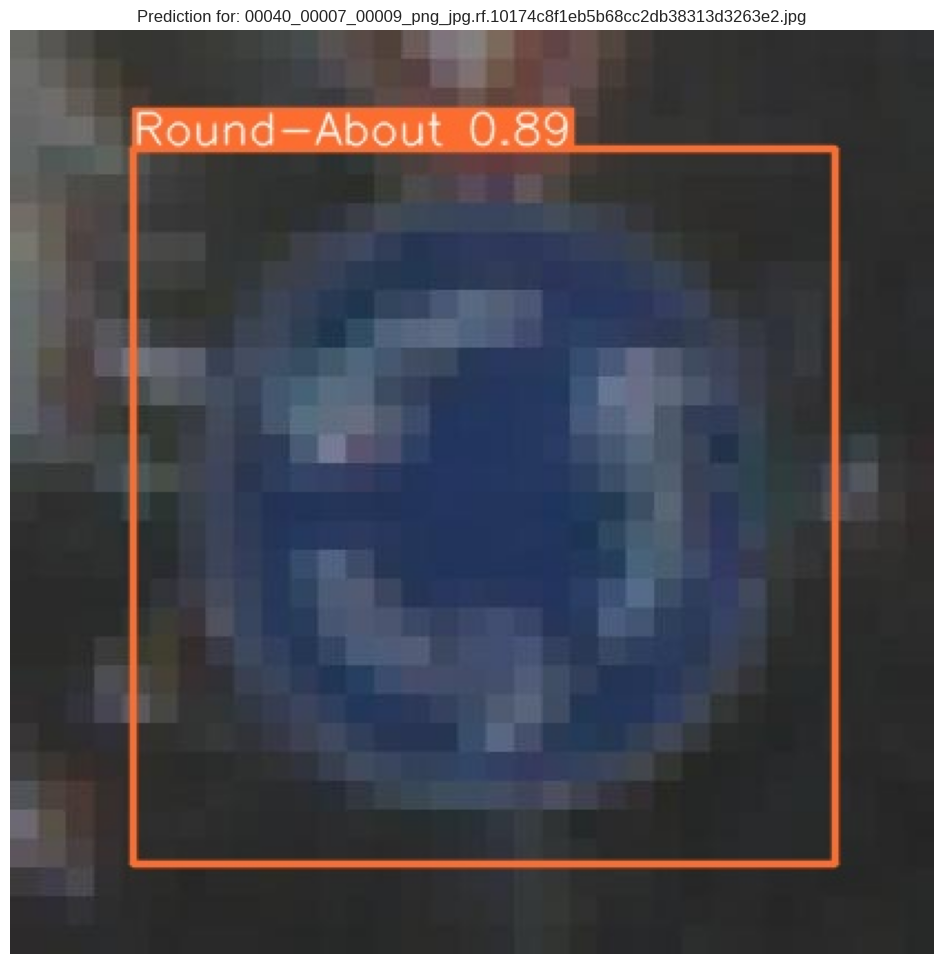

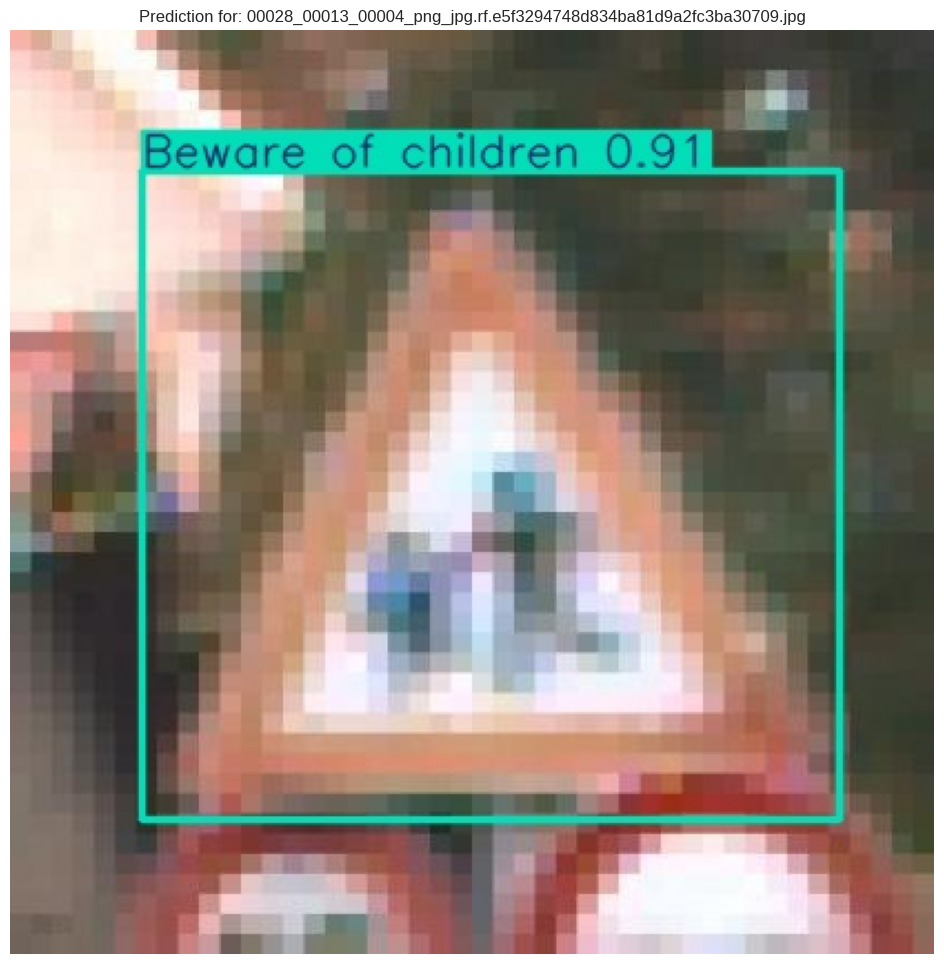

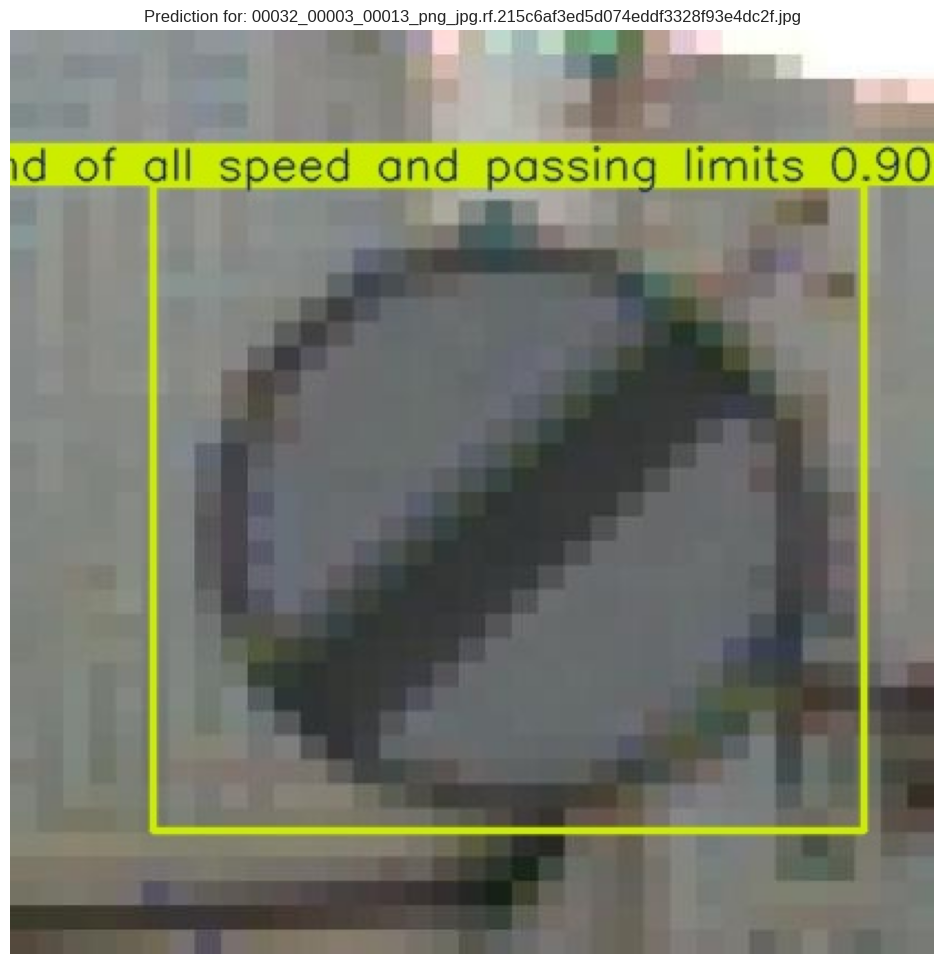

In [ ]:

!pip install ultralytics pandas matplotlib seaborn -q

import os
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from IPython.display import Image, display


latest_dir = '/kaggle/working/runs/detect/traffic_signs_yolov8l_high_accuracy'
best_model_path = os.path.join(latest_dir, 'weights/best.pt')

DATASET_PATH = '/kaggle/working/Traffic-and-Road-Signs-1'
data_yaml_path = os.path.join(DATASET_PATH, 'data.yaml')


if os.path.exists(best_model_path):
    print(f"Loading the (overfitted) yolov8l model from: {best_model_path}")
    

    model = YOLO(best_model_path)
    
    metrics = model.val(data=data_yaml_path, split='val')

    print(f"   mAP50-95: {metrics.box.map:.4f}")
    print(f"      mAP50: {metrics.box.map50:.4f}")  # <-- This will be your 0.942 (94.2%)
    print(f"  Precision: {metrics.box.mp:.4f}")
    print(f"     Recall: {metrics.box.mr:.4f}")


    display(Image(filename=os.path.join(latest_dir, 'confusion_matrix.png'), width=800))

    display(Image(filename=os.path.join(latest_dir, 'val_batch0_pred.jpg'), width=800))

    val_images_path = os.path.join(DATASET_PATH, 'valid/images')
    sample_val_images = glob.glob(os.path.join(val_images_path, '*.jp*g')) + \
                         glob.glob(os.path.join(val_images_path, '*.png'))

    sample_val_images = sample_val_images[10:20] 

    if sample_val_images:
        results = model.predict(sample_val_images, save=True, project=latest_dir, name='val_predictions_big', exist_ok=True)
        prediction_dir = os.path.join(latest_dir, 'val_predictions_big')
        
        for img_path in sample_val_images:
            pred_img_path = os.path.join(prediction_dir, os.path.basename(img_path))
            if os.path.exists(pred_img_path):

                plt.figure(figsize=(18, 12)) 
                img = plt.imread(pred_img_path)
                plt.imshow(img)
                plt.axis('off')
                plt.title(f"Prediction for: {os.path.basename(img_path)}")
                plt.show()
            else:
                print(f"Could not find prediction for {img_path}")
    else:
        print(f"No validation images found in {val_images_path}")

else:
    print(f"Model File Not Found")